In [1]:
import tensorflow as tf
import keras as k


tf.__version__





'2.4.0'

In [2]:
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 11924243301658977125,
 name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 6938994944
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 9796036106425142495
 physical_device_desc: "device: 0, name: GeForce RTX 3060 Ti, pci bus id: 0000:01:00.0, compute capability: 8.6"]

In [3]:
#from keras.applications import DenseNet121 as model

# 모델 생성 방법

### tensorflow 에서는 딥러닝 모델을 만드는 방법이 아래와 같이 3가지가 있습니다.

#### 1. Sequential 모델
 - 가장 구현하기 쉬운 방법입니다. Sequential 모델을 생성하여 원하는 layer를 순차적으로 add하는 방식입니다. 다만 이 방법으로는 직관적인 모델을 빠르게 구현할 수 있지만, 구조가 조금 복잡해지면 구현하기 어려울 수 있다는 단점이 있습니다.
 
#### 2. Functional 모델
 - 두번째로 Functional 모델입니다. input layer부터 output layer까지 직접 forward 순서대로 함수 끝에 입력 변수를 넣어 줍니다. 최종적으로는 Model(inputs, outputs) 과 같이 입력 layer와 출력 layer를 지정해 줌으로써 모델을 만들 수 있습니다. 무난하게 자주 사용하는 방법입니다.
 
#### 3. Subclassing 모델
 - 마지막으로 Subclassing 모델입니다. pytorch와 구현 방식이 비슷하여 개인적으로 가장 선호하는 방법입니다. 직접 모델 클래스를 생성하고 Model 모듈을 상속 받습니다. 그리고 __init__함수에는 사용할 layer들을 작성하고, call함수에는 init에서 작성한 layer에 맞게 forward 해 줍니다.

# Densenet121 구조
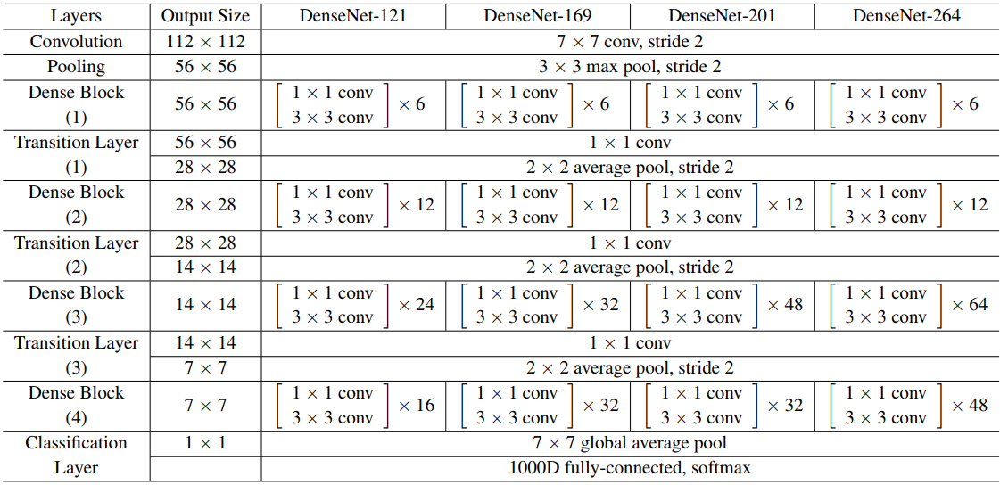

# 단일 이미지 불러오기

In [4]:
from keras.preprocessing import image

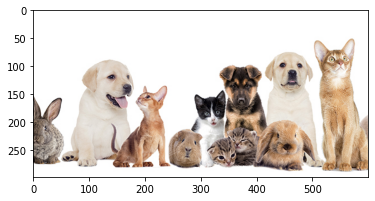

In [5]:
imgdata= image.load_img('sample2.jpg')

import matplotlib.pyplot as plt
x = image.img_to_array(imgdata)/255
plt.imshow(x)
plt.show()

# 다중 이미지 불러오기

In [6]:
from keras.preprocessing.image import ImageDataGenerator

# 이미지 전처리과정
data_generator = ImageDataGenerator(rescale=1./255)
#이미지 픽셀값을 0 ~ 1 값으로 맞춰주기 위해 rescale = 1. / 255로 설정

Found 54315 images belonging to 6 classes.
Found 12800 images belonging to 6 classes.
32
[0. 1. 0. 0. 0. 0.] (224, 224, 3)


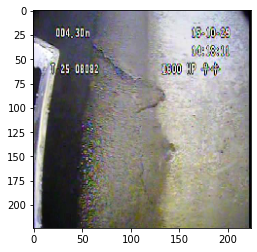

In [7]:
traindata = data_generator.flow_from_directory(
    'C:/Users/negga/Desktop/AiTest/categotraindata/pipe',
    target_size=(224,224),
    batch_size=32,
    class_mode='categorical'
    #class_mode='binary'
)
validata = data_generator.flow_from_directory(
    'C:/Users/negga/Desktop/AiTest/vali4',
    target_size=(224,224),
    batch_size=32,
    class_mode='categorical'
    #class_mode='binary'
    
)
# ImageDataGenerator의 flow_from_directory함수를 이용하여 pipe 폴더 내의 데이터를 자동으로 라벨링하여 불러옴
# class_mode : "categorical", "binary", "sparse", "input"또는 None 중  하나의 옵션을 줄 수 있으며 이진 분류를 하기위해 #binary로 설정

len(traindata)


x_train, y_train = traindata.next()
print(len(x_train))

print(y_train[0], x_train[0].shape)

plt.imshow(x_train[0])

plt.show()


In [8]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Dense
from tensorflow.keras.layers import AvgPool2D, GlobalAveragePooling2D, MaxPool2D
from tensorflow.keras.models import Model
from tensorflow.keras.layers import ReLU, concatenate
import tensorflow.keras.backend as K


# Creating Densenet121
def densenet(input_shape, n_classes, filters = 32):
    
     # padding 옵션 
    # same : 필터의 사이즈가 k이면 사방으로 k/2 만큼의 패딩을 준다.
    # vaild : 패딩을 하지않음 (사이즈가 맞지 않을 경우 가장 우측의 열 혹은 가장 아래의 행을 드랍한다.)
    
    
    #batch norm + relu + conv
    def bn_rl_conv(x,filters,kernel=1,strides=1):
        
        x = BatchNormalization()(x)
        x = ReLU()(x)
        x = Conv2D(filters, kernel, strides=strides,padding = 'same')(x)
        return x
    
    def dense_block(x, repetition):
        
        for _ in range(repetition):
            y = bn_rl_conv(x, 4*filters)
            y = bn_rl_conv(y, filters, 3)
            x = concatenate([y,x])
        return x
        
    def transition_layer(x):
        
        x = bn_rl_conv(x, K.int_shape(x)[-1] //2 )
        x = AvgPool2D(2, strides = 2, padding = 'same')(x)
        return x
    
    input = Input (input_shape)
    x = Conv2D(64, 7, strides = 2, padding = 'same')(input)
    
    # tf.keras.layers.Conv2D(filter,kernel_size,stride,padding)
    # filter : 필터 개수
    # kernel_size : 필터의 크기
    # stride : 연산시 필터의 이동 칸 수
    # padding : 연산시 input의 크기의 결정하는 옵션
    
    # 224 * 224 인풋데이터 
    # =>  (224 - 7 +(2 * 3))/2 + 1
    #112*112 아웃풋
    
    
    x = MaxPool2D(3, strides = 2, padding = 'same')(x)
    
    # 112 * 112 인풋데이터 
    # =>  (112 - 3 +(2 * 1))/2 + 1
    #56*56 아웃풋
    
    for repetition in [6,12,24,16]:
        
        d = dense_block(x, repetition)
        x = transition_layer(d)
        
    x = GlobalAveragePooling2D()(d)
    output = Dense(n_classes, activation = 'softmax')(x)
    
    model = Model(input, output)
    return model

input_shape = 224, 224, 3
n_classes = 2

model = densenet(input_shape,n_classes)
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 112, 112, 64) 9472        input_1[0][0]                    
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 56, 56, 64)   0           conv2d[0][0]                     
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 56, 56, 64)   256         max_pooling2d[0][0]              
______________________________________________________________________________________________

In [9]:
from tensorflow.keras.applications import DenseNet121



model = DenseNet121(include_top=True, weights=None, input_tensor=None, input_shape=(224,224,3), pooling=None, classes=6)

model.summary()

Model: "densenet121"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
________________________________________________________________________________________

In [11]:
tf.keras.utils.plot_model(model)

('Failed to import pydot. You must `pip install pydot` and install graphviz (https://graphviz.gitlab.io/download/), ', 'for `pydotprint` to work.')


In [12]:
opt = tf.keras.optimizers.Adam(learning_rate=0.01)
model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
#loss 함수 변경
#categorical_crossentropy으로 학습을 진행 => binary_crossentropy로 변경
history=model.fit(traindata,epochs=50,batch_size=32,validation_data=validata)

Epoch 1/50


UnknownError:  Failed to get convolution algorithm. This is probably because cuDNN failed to initialize, so try looking to see if a warning log message was printed above.
	 [[node densenet121/conv1/conv/Conv2D (defined at <ipython-input-12-37de9c3d9572>:5) ]] [Op:__inference_train_function_30660]

Function call stack:
train_function


In [12]:
model.save('categorymodel.h5')
print(history.history['loss'])
print(history.history['val_loss'])
print(history.history['accuracy'])
print(history.history['val_accuracy'])
print(history.history.keys())



[1.001470685005188, 0.6089996099472046, 0.43948885798454285, 0.36138486862182617, 0.31975921988487244, 0.2883780598640442, 0.2637467384338379, 0.2373104989528656, 0.2167310267686844, 0.1965826153755188, 0.1762719303369522, 0.15877406299114227, 0.1383056789636612, 0.12328270822763443, 0.10808119922876358, 0.09857194870710373, 0.08810706436634064, 0.08021418005228043, 0.07123178988695145, 0.06832419335842133, 0.06574811786413193, 0.055883485823869705, 0.05668453872203827, 0.05066315084695816, 0.04740259796380997, 0.0485544316470623, 0.04636038839817047, 0.046551384031772614, 0.039938170462846756, 0.041390955448150635, 0.0385202132165432, 0.039093613624572754, 0.036207132041454315, 0.03592195361852646, 0.034957874566316605, 0.03378947079181671, 0.031444985419511795, 0.03013814240694046, 0.02986087091267109, 0.028340717777609825, 0.030937934294342995, 0.02692391909658909, 0.028521763160824776, 0.02492600493133068, 0.029489798471331596, 0.024463297799229622, 0.026745105162262917, 0.02469560

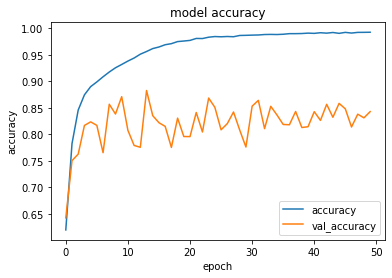

In [13]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])


plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['accuracy','val_accuracy'])
plt.show()

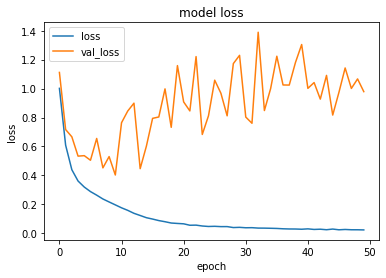

In [14]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')

plt.ylabel('loss')
plt.xlabel('epoch')
#plt.ylim([-10, 10])         # Y축의 범위: [ymin, ymax]
plt.legend(['loss','val_loss'])
plt.show()

In [15]:
traindata = data_generator.flow_from_directory(
    'C:/Users/negga/Desktop/AiTest/bintraindata4/pipe',
    target_size=(224,224),
    batch_size=32,
    class_mode='categorical'
    #class_mode='binary'
)
validata = data_generator.flow_from_directory(
    'C:/Users/negga/Desktop/AiTest/vali3/pipe',
    target_size=(224,224),
    batch_size=32,
    class_mode='categorical'
    #class_mode='binary'
    
)

Found 16000 images belonging to 2 classes.
Found 4000 images belonging to 2 classes.


In [16]:
from tensorflow.keras.applications import DenseNet121



model = DenseNet121(include_top=True, weights=None, input_tensor=None, input_shape=(224,224,3), pooling=None, classes=2)

model.summary()

Model: "densenet121"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d_2 (ZeroPadding2D (None, 230, 230, 3)  0           input_3[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d_2[0][0]           
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
________________________________________________________________________________________

In [17]:
opt = k.optimizers.Adam(learning_rate=0.01)
model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
#loss 함수 변경
#categorical_crossentropy으로 학습을 진행 => binary_crossentropy로 변경
history=model.fit(traindata,epochs=50,batch_size=32,validation_data=validata)

Epoch 1/50
500/500 [==============================] - 120s 224ms/step - loss: 0.2896 - accuracy: 0.8935 - val_loss: 11.9162 - val_accuracy: 0.5015
Epoch 2/50
500/500 [==============================] - 108s 216ms/step - loss: 0.0672 - accuracy: 0.9785 - val_loss: 0.6023 - val_accuracy: 0.7415
Epoch 3/50
500/500 [==============================] - 108s 216ms/step - loss: 0.0388 - accuracy: 0.9899 - val_loss: 8.5139 - val_accuracy: 0.4995
Epoch 4/50
500/500 [==============================] - 108s 216ms/step - loss: 0.0330 - accuracy: 0.9902 - val_loss: 1.7227 - val_accuracy: 0.5638
Epoch 5/50
500/500 [==============================] - 108s 216ms/step - loss: 0.0224 - accuracy: 0.9939 - val_loss: 0.4507 - val_accuracy: 0.8580
Epoch 6/50
500/500 [==============================] - 108s 216ms/step - loss: 0.0214 - accuracy: 0.9948 - val_loss: 1.4084 - val_accuracy: 0.8165
Epoch 7/50
500/500 [==============================] - 108s 216ms/step - loss: 0.0190 - accuracy: 0.9953 - val_loss: 0.4993 

In [18]:
model.save('binmodel.h5')

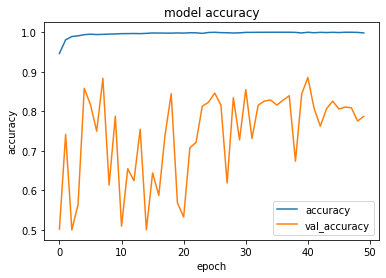

In [19]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])


plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['accuracy','val_accuracy'])
plt.show()

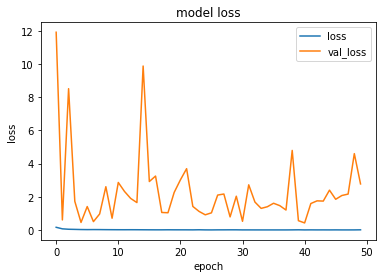

In [20]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')

plt.ylabel('loss')
plt.xlabel('epoch')
#plt.ylim([-10, 10])         # Y축의 범위: [ymin, ymax]
plt.legend(['loss','val_loss'])
plt.show()

# -----------------------------------------------------------------------------------------------------

In [1]:
from keras.models import load_model
model = load_model('binmodel.h5')

In [2]:
import numpy as np

img = image.load_img('캡처2.jpg', target_size=(224, 224))
# 예측할 이미지를 불러옴 사이즈는 (224 * 224)로 변경

plt.imshow(img)
#출력
print(image.img_to_array(img))
x = image.img_to_array(img)/255
#불러온 이미지를 배열로 변경하여 1~255의 값으로 구성되어있는것을 0~1까지의 값으로 보여주기 위하여 255를 나누어줌
print(x)
print(x.shape)

x  = np.expand_dims(x,axis=0)

res=model.predict(x)

print(res)

result=np.argmax(res)
#제일큰 값의 index 저장


print(result)
if result==0:
    print('연결관')
elif result == 1:
    print('균열')
elif result == 2:
    print('이음부')    
elif result == 3:
    print('정상')
elif result == 4:
    print('토사퇴적')
elif result == 5:
    print('관 파손')

NameError: name 'image' is not defined

[[0.00206995 0.99793005]]
정상
[[0.00244043 0.99755955]]
정상
[[0.00186381 0.99813616]]
정상
[[0.00185099 0.99814904]]
정상
[[0.00181396 0.99818605]]
정상
[[0.00187731 0.99812263]]
정상
[[0.0017376  0.99826247]]
정상
[[0.00178383 0.9982161 ]]
정상
[[0.00181337 0.99818665]]
정상
[[0.00144357 0.99855644]]
정상
[[0.00188724 0.9981128 ]]
정상
[[0.00220759 0.99779236]]
정상
[[0.00196606 0.99803394]]
정상
[[0.00212295 0.9978771 ]]
정상
[[0.00189468 0.9981053 ]]
정상
[[0.00200599 0.99799407]]
정상
[[0.00244032 0.99755967]]
정상
[[0.0027098  0.99729025]]
정상
[[0.00261551 0.9973845 ]]
정상
[[0.00238949 0.99761057]]
정상
[[0.00282126 0.9971788 ]]
정상
[[0.00270078 0.99729925]]
정상
[[0.00264383 0.9973562 ]]
정상
[[0.00276685 0.9972332 ]]
정상
[[0.00235598 0.997644  ]]
정상
[[0.00176066 0.9982393 ]]
정상
[[0.00184812 0.99815184]]
정상
[[0.00180897 0.99819106]]
정상
[[0.00170279 0.9982973 ]]
정상
[[0.00178275 0.9982173 ]]
정상
[[0.00192519 0.99807477]]
정상
[[0.00245652 0.9975434 ]]
정상
[[0.00291658 0.99708337]]
정상
[[0.00265397 0.99734604]]
정상
[[0.00186363 0

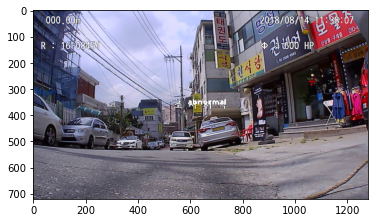

[[0.38180834 0.6181916 ]]
정상
[[0.4489093  0.55109066]]
정상
[[0.8696775  0.13032249]]
비정상
abnormal


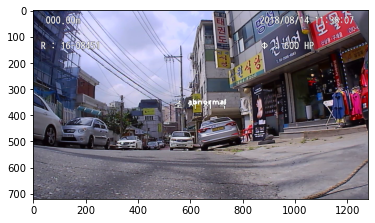

[[0.9055921  0.09440795]]
비정상
abnormal


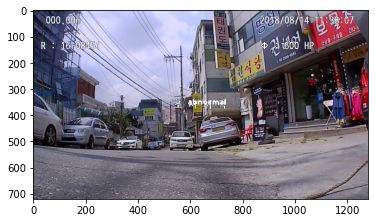

[[0.76591104 0.23408894]]
비정상
abnormal


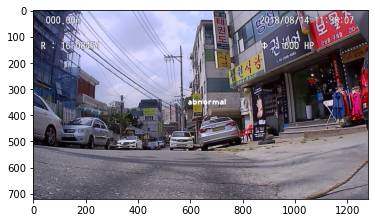

[[0.8681279  0.13187212]]
비정상
abnormal


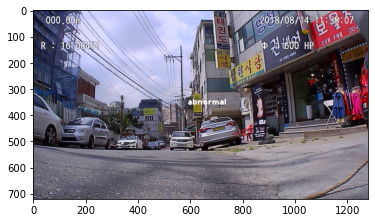

[[0.9526677  0.04733226]]
비정상
abnormal


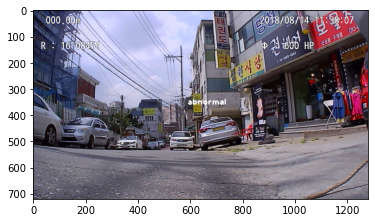

[[0.8953123  0.10468773]]
비정상
abnormal


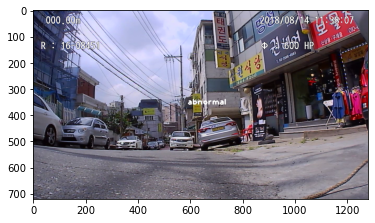

[[0.88836795 0.11163203]]
비정상
abnormal


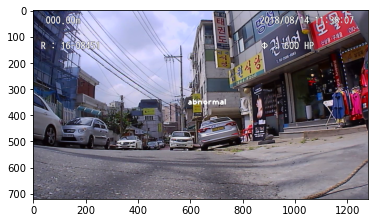

[[0.3825429 0.6174571]]
정상
[[0.9977841  0.00221596]]
비정상
abnormal


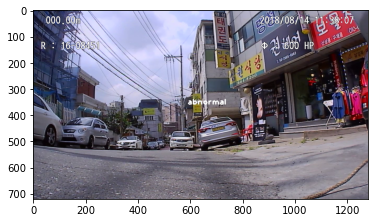

[[0.96699476 0.0330053 ]]
비정상
abnormal


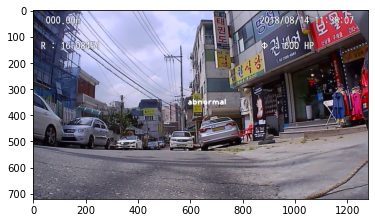

[[0.23583934 0.76416063]]
정상
[[0.8397504 0.1602496]]
비정상
abnormal


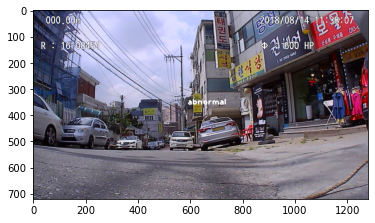

[[0.50630623 0.4936938 ]]
비정상
abnormal


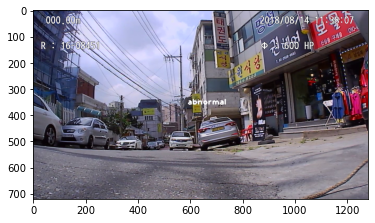

[[0.08928708 0.91071296]]
정상
[[0.96434927 0.03565072]]
비정상
abnormal


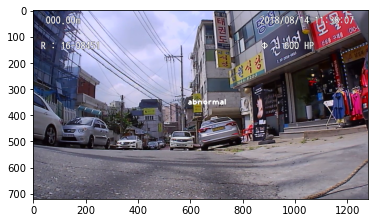

[[0.7208791  0.27912092]]
비정상
abnormal


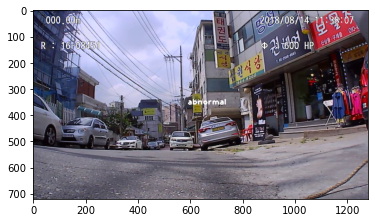

[[0.7518356 0.2481644]]
비정상
abnormal


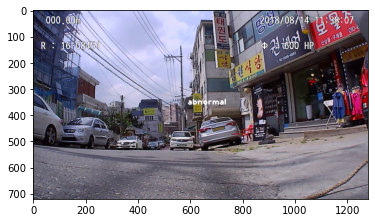

[[0.9049093  0.09509069]]
비정상
abnormal


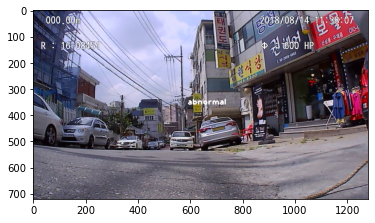

[[0.7922472  0.20775282]]
비정상
abnormal


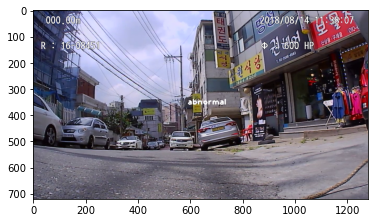

[[0.7118781  0.28812194]]
비정상
abnormal


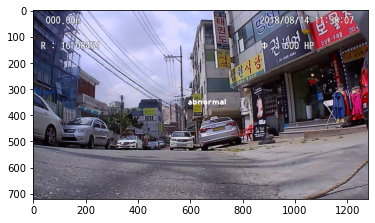

[[0.75383997 0.24616006]]
비정상
abnormal


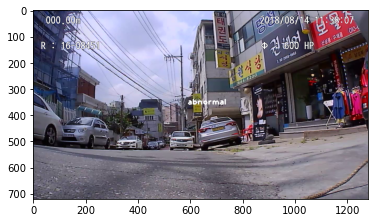

[[0.69642204 0.30357796]]
비정상
abnormal


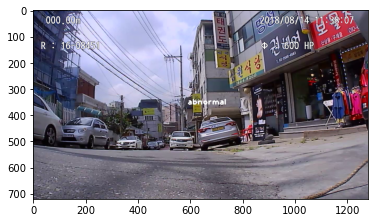

[[0.6460883  0.35391167]]
비정상
abnormal


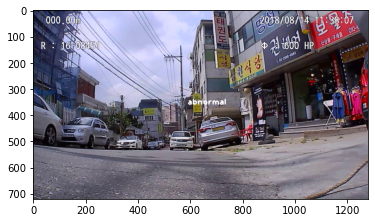

[[0.83092177 0.16907825]]
비정상
abnormal


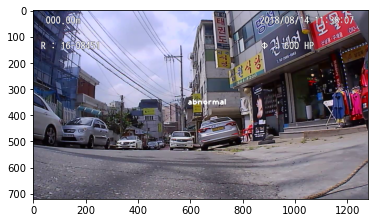

[[0.67209536 0.32790464]]
비정상
abnormal


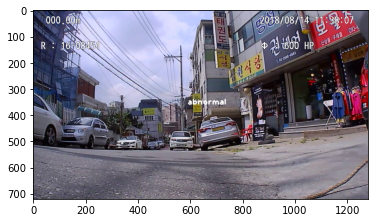

[[0.51271945 0.48728052]]
비정상
abnormal


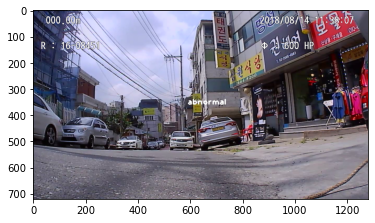

[[0.54522014 0.45477986]]
비정상
abnormal


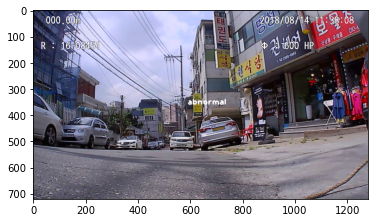

[[0.8484668  0.15153316]]
비정상
abnormal


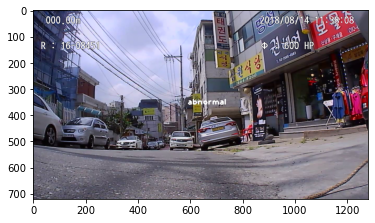

[[0.6086713  0.39132875]]
비정상
abnormal


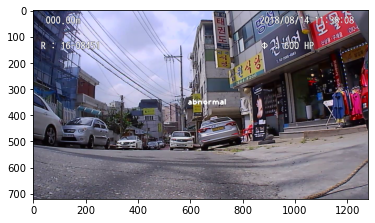

[[0.43879908 0.5612009 ]]
정상
[[0.83672565 0.16327436]]
비정상
abnormal


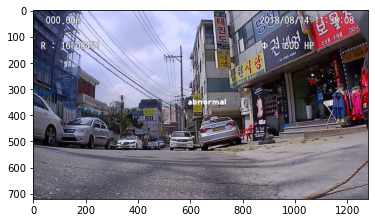

[[0.8547871  0.14521287]]
비정상
abnormal


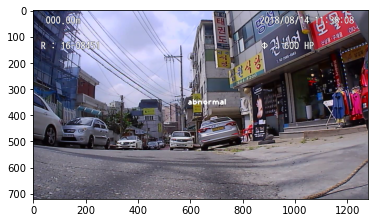

[[0.85520136 0.14479864]]
비정상
abnormal


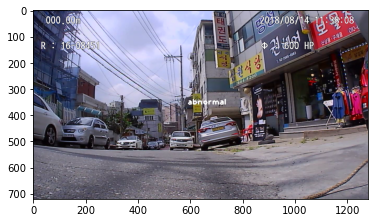

[[0.92839295 0.07160702]]
비정상
abnormal


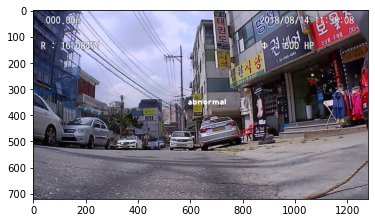

[[0.98095393 0.01904601]]
비정상
abnormal


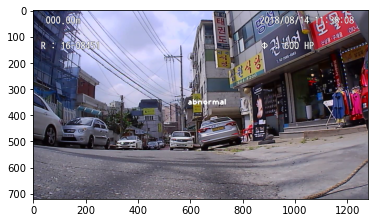

[[0.9776764  0.02232361]]
비정상
abnormal


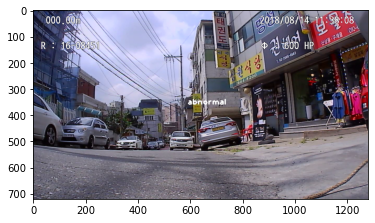

[[0.9835805  0.01641946]]
비정상
abnormal


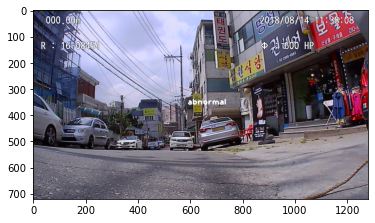

[[0.9637853  0.03621466]]
비정상
abnormal


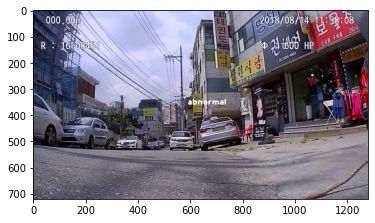

[[0.84933305 0.15066688]]
비정상
abnormal


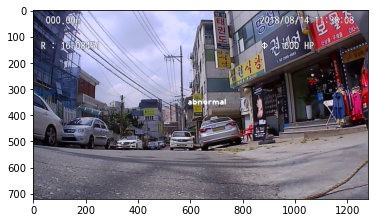

[[0.22412719 0.7758728 ]]
정상
[[0.96834576 0.03165427]]
비정상
abnormal


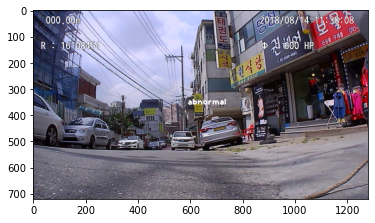

[[0.00402298 0.995977  ]]
정상
[[0.00125456 0.99874544]]
정상
[[0.00236487 0.9976351 ]]
정상
[[9.9944621e-01 5.5372197e-04]]
비정상
abnormal


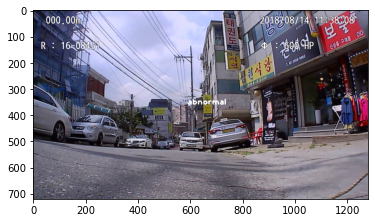

[[0.18462634 0.81537366]]
정상
[[0.00880881 0.9911912 ]]
정상
[[0.93044865 0.0695513 ]]
비정상
abnormal


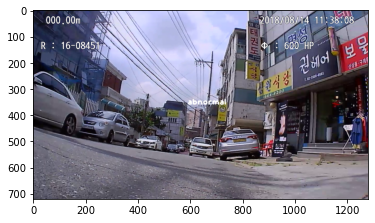

[[0.91488093 0.08511906]]
비정상
abnormal


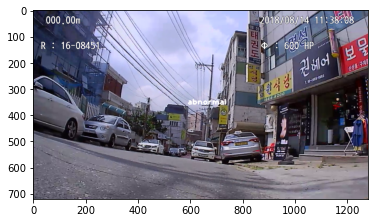

[[0.99371594 0.00628409]]
비정상
abnormal


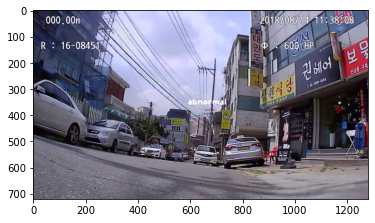

[[0.1100628 0.8899372]]
정상
[[0.9619201  0.03807988]]
비정상
abnormal


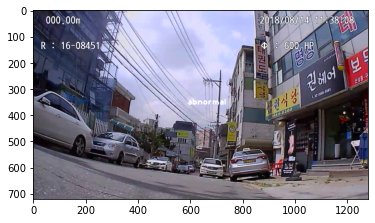

[[0.79037714 0.20962283]]
비정상
abnormal


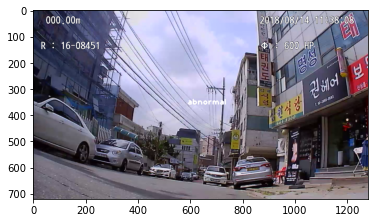

[[0.09898137 0.9010187 ]]
정상
[[0.7096061  0.29039386]]
비정상
abnormal


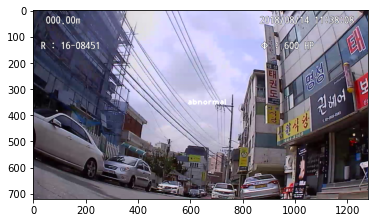

[[0.72607493 0.2739251 ]]
비정상
abnormal


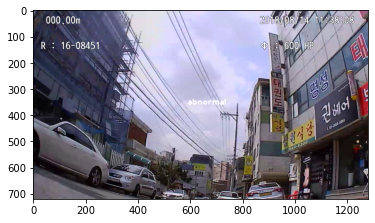

[[0.03312273 0.9668773 ]]
정상
[[0.12513834 0.8748617 ]]
정상
[[0.2555513  0.74444866]]
정상
[[0.99713254 0.00286742]]
비정상
abnormal


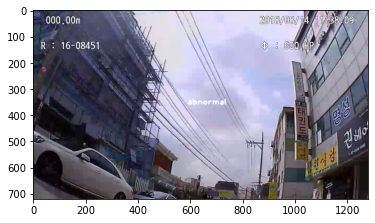

[[0.9794519  0.02054814]]
비정상
abnormal


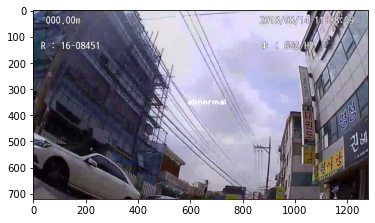

[[9.999280e-01 7.201234e-05]]
비정상
abnormal


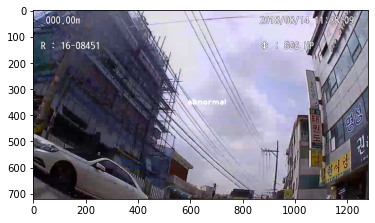

[[9.9982291e-01 1.7714653e-04]]
비정상
abnormal


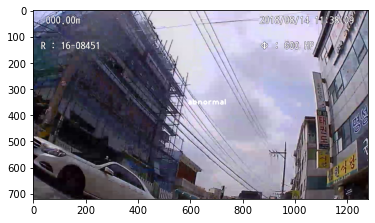

[[0.9968862 0.0031138]]
비정상
abnormal


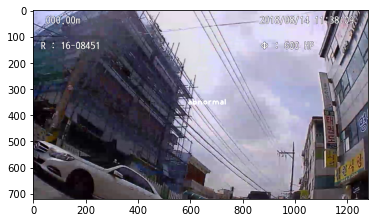

[[0.99597245 0.00402759]]
비정상
abnormal


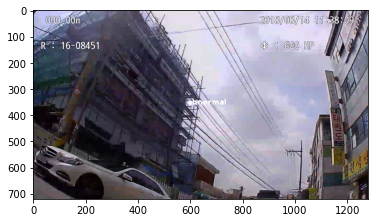

[[0.9986927  0.00130728]]
비정상
abnormal


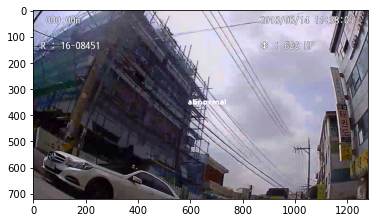

[[0.90471864 0.09528139]]
비정상
abnormal


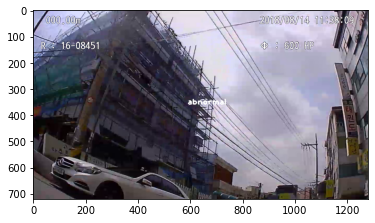

[[0.00600395 0.993996  ]]
정상
[[0.01662664 0.9833733 ]]
정상
[[0.00314003 0.99686   ]]
정상
[[7.6116336e-04 9.9923885e-01]]
정상
[[4.0207835e-04 9.9959797e-01]]
정상
[[0.1221665  0.87783355]]
정상
[[0.02345583 0.97654414]]
정상
[[8.610731e-06 9.999914e-01]]
정상
[[0.18173315 0.8182668 ]]
정상
[[0.81050074 0.18949927]]
비정상
abnormal


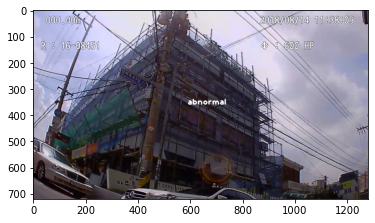

[[0.06157533 0.93842465]]
정상
[[0.78970045 0.21029958]]
비정상
abnormal


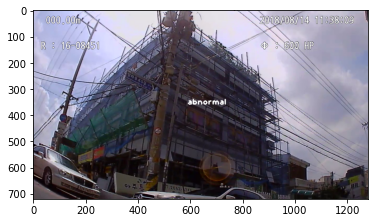

[[0.01382246 0.98617756]]
정상
[[0.22353509 0.7764649 ]]
정상
[[0.01616545 0.9838345 ]]
정상
[[0.01596045 0.9840396 ]]
정상
[[0.00275195 0.997248  ]]
정상
[[0.00504462 0.99495536]]
정상
[[0.27867195 0.721328  ]]
정상
[[0.04913866 0.95086133]]
정상
[[0.00404042 0.9959596 ]]
정상
[[4.8998656e-04 9.9951005e-01]]
정상
[[0.6185334  0.38146657]]
비정상
abnormal


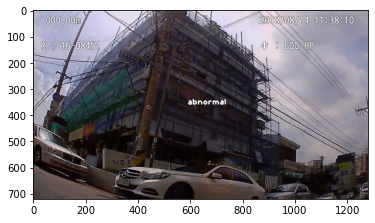

[[5.9775815e-05 9.9994028e-01]]
정상
[[0.01166171 0.9883383 ]]
정상
[[0.02614136 0.97385865]]
정상
[[0.95109314 0.04890687]]
비정상
abnormal


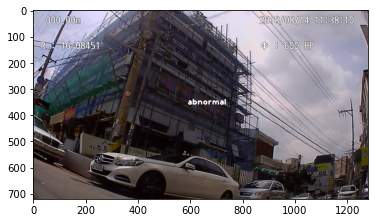

[[0.43300754 0.56699246]]
정상
[[0.01787266 0.98212737]]
정상
[[0.95937794 0.04062201]]
비정상
abnormal


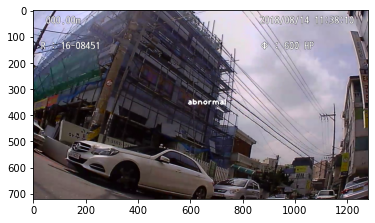

[[9.9999714e-01 2.8799734e-06]]
비정상
abnormal


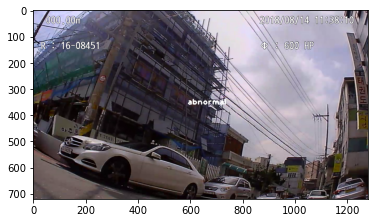

[[0.997929   0.00207096]]
비정상
abnormal


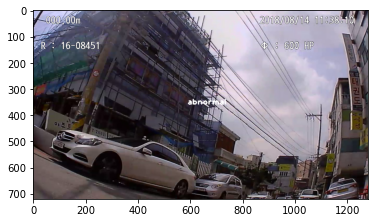

[[0.99727136 0.00272864]]
비정상
abnormal


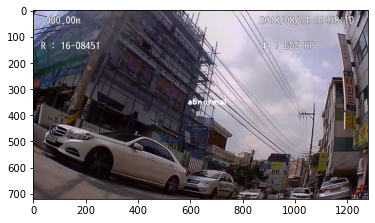

[[9.9960178e-01 3.9818266e-04]]
비정상
abnormal


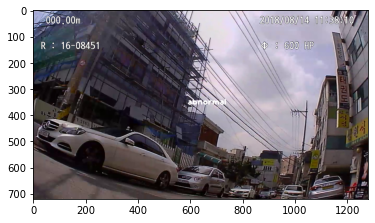

[[0.9988557 0.0011443]]
비정상
abnormal


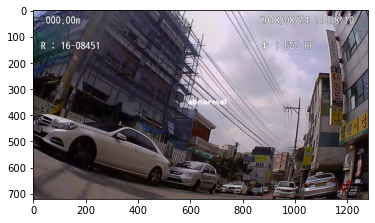

[[0.8805367  0.11946335]]
비정상
abnormal


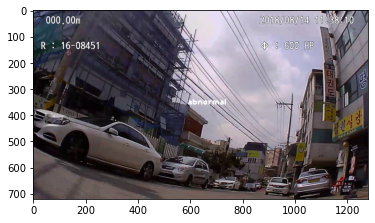

[[0.91628516 0.08371485]]
비정상
abnormal


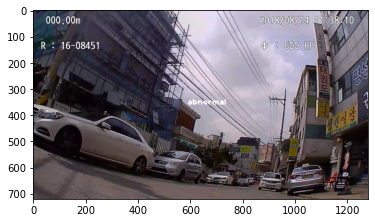

[[0.95416135 0.04583862]]
비정상
abnormal


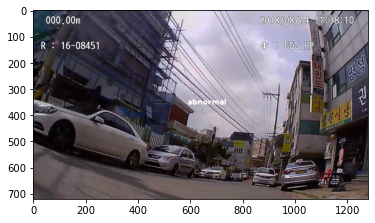

[[0.02289977 0.97710025]]
정상
[[8.8108587e-04 9.9911886e-01]]
정상
[[0.00826832 0.9917317 ]]
정상
[[0.02854684 0.9714532 ]]
정상
[[0.19613084 0.8038692 ]]
정상
[[0.87409717 0.12590285]]
비정상
abnormal


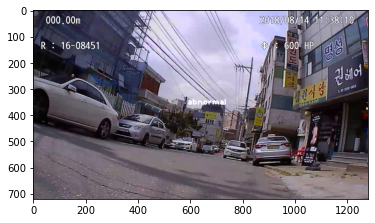

[[0.03700649 0.96299356]]
정상
[[0.1593899 0.8406101]]
정상
[[0.6508313  0.34916872]]
비정상
abnormal


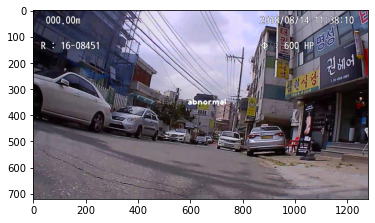

[[0.15747091 0.84252906]]
정상
[[0.96276635 0.03723365]]
비정상
abnormal


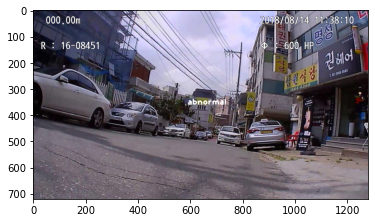

[[0.0121584  0.98784167]]
정상
[[0.7074827  0.29251733]]
비정상
abnormal


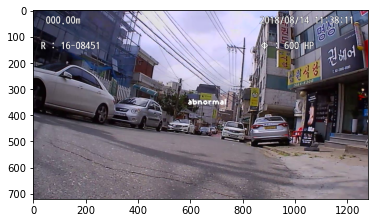

[[0.03440886 0.9655912 ]]
정상
[[0.14569554 0.8543045 ]]
정상
[[0.9959559  0.00404405]]
비정상
abnormal


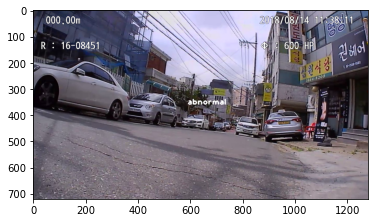

[[0.15957305 0.8404269 ]]
정상
[[0.00965312 0.99034685]]
정상
[[0.00590229 0.9940977 ]]
정상
[[9.9999964e-01 3.5404827e-07]]
비정상
abnormal


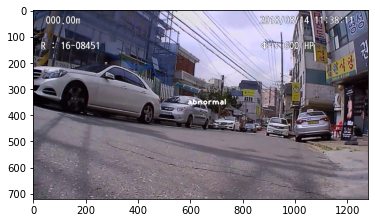

[[0.06520408 0.9347959 ]]
정상
[[0.99482936 0.00517066]]
비정상
abnormal


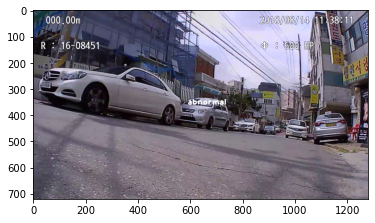

[[9.995080e-01 4.919849e-04]]
비정상
abnormal


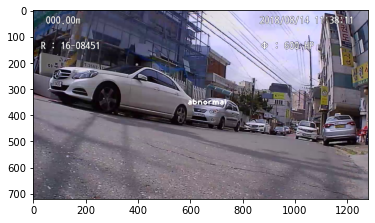

[[9.9992061e-01 7.9403224e-05]]
비정상
abnormal


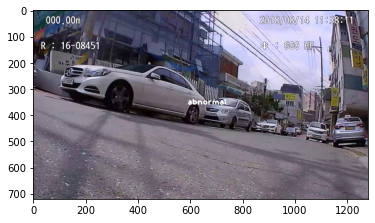

[[0.8463552  0.15364479]]
비정상
abnormal


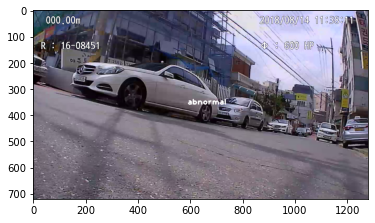

[[0.10861111 0.89138895]]
정상
[[0.06378193 0.93621814]]
정상
[[0.00221383 0.99778616]]
정상
[[0.00458447 0.99541557]]
정상
[[0.0244935  0.97550654]]
정상
[[0.00110704 0.99889296]]
정상
[[5.146557e-06 9.999949e-01]]
정상
[[0.09576921 0.90423083]]
정상
[[0.3662503 0.6337497]]
정상
[[9.9999213e-01 7.8571866e-06]]
비정상
abnormal


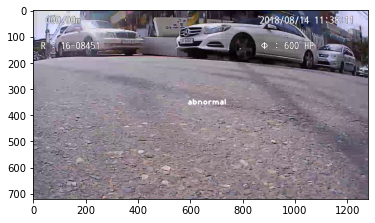

[[9.9984312e-01 1.5684261e-04]]
비정상
abnormal


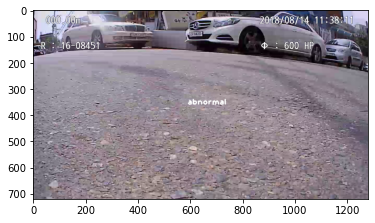

[[0.025947 0.974053]]
정상
[[0.00533169 0.9946683 ]]
정상
[[0.25351658 0.7464834 ]]
정상
[[9.9997890e-01 2.1054877e-05]]
비정상
abnormal


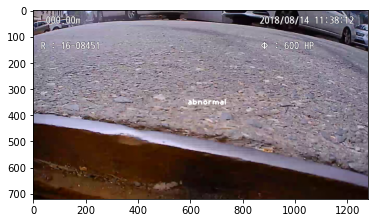

[[9.999621e-01 3.787122e-05]]
비정상
abnormal


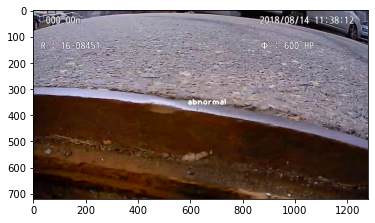

[[0.96329856 0.03670142]]
비정상
abnormal


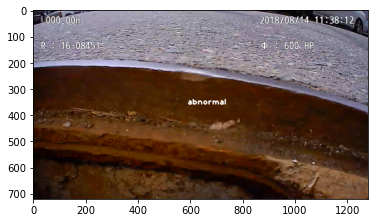

[[0.9306508  0.06934917]]
비정상
abnormal


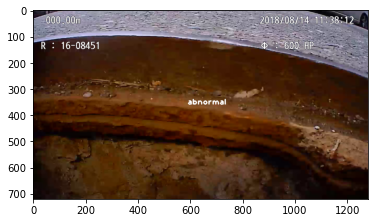

[[9.551979e-05 9.999045e-01]]
정상
[[2.6245596e-04 9.9973756e-01]]
정상
[[2.306848e-04 9.997693e-01]]
정상
[[3.4548598e-04 9.9965453e-01]]
정상
[[3.2813568e-04 9.9967182e-01]]
정상
[[0.00643166 0.99356836]]
정상
[[0.00363893 0.9963611 ]]
정상
[[0.00192931 0.99807066]]
정상
[[9.0497005e-04 9.9909508e-01]]
정상
[[0.00370148 0.9962985 ]]
정상
[[0.22666444 0.77333564]]
정상
[[0.01932525 0.9806748 ]]
정상
[[5.4352509e-04 9.9945647e-01]]
정상
[[0.00131244 0.99868757]]
정상
[[0.06906082 0.93093914]]
정상
[[0.13848886 0.8615111 ]]
정상
[[0.00388532 0.9961146 ]]
정상
[[0.01215627 0.98784375]]
정상
[[0.05714126 0.94285876]]
정상
[[0.00541878 0.99458116]]
정상
[[0.00251344 0.9974866 ]]
정상
[[1.1620422e-04 9.9988377e-01]]
정상
[[2.9984754e-04 9.9970019e-01]]
정상
[[6.1457709e-04 9.9938536e-01]]
정상
[[0.00187118 0.99812883]]
정상
[[0.00278263 0.9972174 ]]
정상
[[3.5525992e-04 9.9964476e-01]]
정상
[[2.088562e-04 9.997912e-01]]
정상
[[9.620732e-05 9.999038e-01]]
정상
[[0.0017953 0.9982047]]
정상
[[2.4226701e-04 9.9975771e-01]]
정상
[[0.00327956 0.9967204 ]]
정

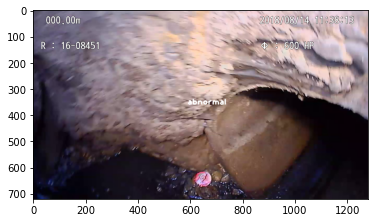

[[0.32051933 0.67948073]]
정상
[[0.10163028 0.8983697 ]]
정상
[[0.01744809 0.98255193]]
정상
[[5.2579373e-05 9.9994743e-01]]
정상
[[0.00382958 0.99617046]]
정상
[[0.00798068 0.99201936]]
정상
[[0.00166754 0.99833244]]
정상
[[6.6269306e-05 9.9993372e-01]]
정상
[[2.8113441e-06 9.9999714e-01]]
정상
[[1.6579880e-06 9.9999833e-01]]
정상
[[1.174155e-06 9.999988e-01]]
정상
[[7.9073766e-07 9.9999917e-01]]
정상
[[2.6550040e-07 9.9999976e-01]]
정상
[[5.4340873e-08 1.0000000e+00]]
정상
[[4.6453720e-06 9.9999535e-01]]
정상
[[1.8518642e-05 9.9998152e-01]]
정상
[[1.2298561e-05 9.9998772e-01]]
정상
[[1.9034072e-04 9.9980968e-01]]
정상
[[6.4680714e-04 9.9935323e-01]]
정상
[[3.1288979e-05 9.9996877e-01]]
정상
[[7.5526776e-05 9.9992442e-01]]
정상
[[0.00685703 0.99314296]]
정상
[[2.3921975e-04 9.9976081e-01]]
정상
[[7.644485e-05 9.999236e-01]]
정상
[[6.825792e-05 9.999317e-01]]
정상
[[4.6840023e-07 9.9999952e-01]]
정상
[[5.193666e-07 9.999995e-01]]
정상
[[5.8469175e-07 9.9999940e-01]]
정상
[[6.862263e-07 9.999993e-01]]
정상
[[8.0947410e-07 9.9999917e-01]]
정상
[[

[[7.2957005e-07 9.9999928e-01]]
정상
[[8.3387073e-07 9.9999917e-01]]
정상
[[9.3618986e-08 9.9999988e-01]]
정상
[[1.4706677e-07 9.9999988e-01]]
정상
[[3.052063e-04 9.996948e-01]]
정상
[[3.3637186e-04 9.9966359e-01]]
정상
[[1.18370845e-04 9.99881625e-01]]
정상
[[8.502594e-04 9.991497e-01]]
정상
[[2.1786512e-04 9.9978215e-01]]
정상
[[1.3318258e-04 9.9986684e-01]]
정상
[[1.7918048e-04 9.9982089e-01]]
정상
[[1.5388605e-04 9.9984610e-01]]
정상
[[0.00174075 0.99825925]]
정상
[[0.00734043 0.9926596 ]]
정상
[[2.0950801e-04 9.9979049e-01]]
정상
[[1.5516469e-04 9.9984479e-01]]
정상
[[1.724949e-04 9.998275e-01]]
정상
[[5.8094265e-05 9.9994195e-01]]
정상
[[9.1754651e-04 9.9908245e-01]]
정상
[[6.7309165e-06 9.9999332e-01]]
정상
[[4.1298914e-05 9.9995875e-01]]
정상
[[3.766273e-04 9.996233e-01]]
정상
[[3.3164897e-04 9.9966836e-01]]
정상
[[7.320156e-05 9.999268e-01]]
정상
[[0.21247819 0.7875218 ]]
정상
[[3.6195324e-05 9.9996376e-01]]
정상
[[3.8404607e-08 1.0000000e+00]]
정상
[[1.2189225e-08 1.0000000e+00]]
정상
[[4.3257604e-08 1.0000000e+00]]
정상
[[1.8893672

[[1.8083104e-07 9.9999976e-01]]
정상
[[5.831036e-07 9.999994e-01]]
정상
[[3.3886357e-07 9.9999964e-01]]
정상
[[3.085665e-05 9.999691e-01]]
정상
[[1.4028034e-06 9.9999857e-01]]
정상
[[1.6330400e-06 9.9999833e-01]]
정상
[[7.2879025e-06 9.9999273e-01]]
정상
[[3.1986937e-07 9.9999964e-01]]
정상
[[1.7121542e-07 9.9999988e-01]]
정상
[[6.555084e-08 9.999999e-01]]
정상
[[1.8664046e-07 9.9999976e-01]]
정상
[[7.2482345e-09 1.0000000e+00]]
정상
[[2.4099882e-06 9.9999762e-01]]
정상
[[1.7701667e-07 9.9999988e-01]]
정상
[[1.0266653e-04 9.9989736e-01]]
정상
[[0.86224216 0.13775788]]
비정상
abnormal


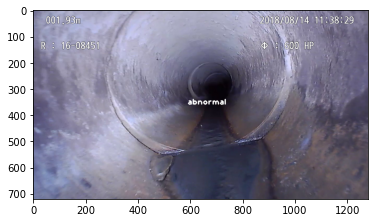

[[0.0060328 0.9939672]]
정상
[[0.02809298 0.971907  ]]
정상
[[3.181226e-05 9.999682e-01]]
정상
[[7.442659e-05 9.999256e-01]]
정상
[[0.02217838 0.9778216 ]]
정상
[[0.00218257 0.9978174 ]]
정상
[[1.6560648e-06 9.9999833e-01]]
정상
[[1.138916e-06 9.999988e-01]]
정상
[[5.3516153e-08 1.0000000e+00]]
정상
[[1.3821901e-04 9.9986172e-01]]
정상
[[3.1557196e-04 9.9968445e-01]]
정상
[[0.00401798 0.99598205]]
정상
[[2.5975507e-05 9.9997401e-01]]
정상
[[1.0027311e-05 9.9998999e-01]]
정상
[[1.36935605e-05 9.99986291e-01]]
정상
[[1.8920227e-06 9.9999809e-01]]
정상
[[1.2906379e-07 9.9999988e-01]]
정상
[[5.6423386e-07 9.9999940e-01]]
정상
[[2.1680187e-04 9.9978322e-01]]
정상
[[2.7287442e-07 9.9999976e-01]]
정상
[[4.1797716e-07 9.9999952e-01]]
정상
[[2.9684717e-05 9.9997032e-01]]
정상
[[6.6717507e-06 9.9999332e-01]]
정상
[[5.1347917e-05 9.9994862e-01]]
정상
[[1.1671301e-05 9.9998832e-01]]
정상
[[2.1956736e-05 9.9997807e-01]]
정상
[[8.7845535e-07 9.9999917e-01]]
정상
[[3.042809e-06 9.999969e-01]]
정상
[[8.986708e-05 9.999101e-01]]
정상
[[8.3405730e-06 9.9999166

In [8]:
import cv2
font = cv2.FONT_HERSHEY_PLAIN
cap = cv2.VideoCapture("cctv.mp4")
import numpy as np
colors = np.random.uniform(0, 255, size=(2, 3))

colors
cap.get(cv2.CAP_PROP_FPS)

w = round(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
h = round(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = cap.get(cv2.CAP_PROP_FPS)
fourcc = cv2.VideoWriter_fourcc(*'DIVX')

out = cv2.VideoWriter('output.mp4', fourcc, fps, (w, h))

while cap.isOpened():
    success,frame = cap.read()
    if success:
        
        data=frame/255
        data=cv2.resize(data,(224,224))
        
        
        data  = np.expand_dims(data,axis=0)
        #print(data.shape)
        res=model.predict(data)
        print(res)
        result=np.argmax(res)
        if result==0:
            print('비정상')
        elif result == 1:
            print('정상')
        elif result == 2:
            print('이음부')    
        elif result == 3:
            print('정상')
        elif result == 4:
            print('토사퇴적')
        elif result == 5:
            print('관 파손')
        else:
            print('기타')
        
        if result == 0:
                print("abnormal")
                cv2.putText(frame, "abnormal", (round(w/2)-50, round(h/2)), font, 2, [255,255,255], 3)
        #elif result==1:
                normalout=cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                plt.imshow(normalout)
                plt.show()
            
        out.write(frame)
        cv2.imshow('test',frame)
        
        if cv2.waitKey(30)&0xFF == 27: 
            break #자원 메모리 해제 
    else :
        break
            
cap.release()
out.release()
cv2.destroyAllWindows()

# -------------------------------------------------------------------------------------------------------------

### 첫번째 학습 모델 (mymodel.h5) = 학습데이터 총 개수 67115 (정상 10000, 비정상 57115) 
####  - 데이터 불균형으로 인해 모델 성능이 좋지않다 판단하여 두번째 학습 모델을 생성
### 두번째 학습 모델 (savemodel.h5)= 학습데이터 총 개수 34100 (정상 9100, 비정상 25000) 검증데이터(정상 900, 비정상 1014)
####  - 모델이 과적합이 일어나는지 확인을 위해 검증데이터로 각 eopch에 대한 검증을 진행하였을 때 모델의 성능이 좋지않은걸 알수있음
### 세번째 학습 모델 (last_model.h5)= 학습데이터 총 67115개 각 클래스별로 20%의 검증 데이터셋을 만들어 학습
####  - loss function : categorical cross entropy-> binary cross entropy 로 변경 learning rate 0.001 변경
####  - 첫번째 결과와 동일
### 네번째 학습 모델 (4th_model.h5)= 학습데이터 총 20000개 각 클래스별로 20%의 검증 데이터셋을 만들어 학습 예정
#### - 학습 전혀 되지않음.
### 5,6번째 학습 모델 이진분류기(2만개),다항분류기 학습 (67115) 각 클래스별 20% 검증데이터셋 학습
#### 이진분류기 = binmodel.h5
#### 다항분류기 = categorymodel.h5